In [2]:
import os
from google.colab import userdata

os.environ["HF_TOKEN"] = userdata.get("HF_TOKEN")

In [3]:
!pip install -q rfdetr

In [4]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [5]:
!gdown "https://drive.google.com/uc?id=1Xa1EJO_Uwv-qr0i72VK2TaQALz7X0EP1&confirm=t"
!gdown "https://drive.google.com/uc?id=1l65gM2eQMhutLP9jpySZfaQIAB_OqO2j&confirm=t"
!gdown "https://drive.google.com/uc?id=1SJEb_dy3ul4mp3Nc8-PSPMp-cXzPo8gq&confirm=t"
!gdown "https://drive.google.com/uc?id=1hl_NNFciFwImmqplL3RkozpiIa8I38cd&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1Xa1EJO_Uwv-qr0i72VK2TaQALz7X0EP1&confirm=t
To: /content/image.jpg
100% 214k/214k [00:00<00:00, 107MB/s]
Downloading...
From: https://drive.google.com/uc?id=1l65gM2eQMhutLP9jpySZfaQIAB_OqO2j&confirm=t
To: /content/video.mp4
100% 3.14M/3.14M [00:00<00:00, 178MB/s]
Downloading...
From: https://drive.google.com/uc?id=1SJEb_dy3ul4mp3Nc8-PSPMp-cXzPo8gq&confirm=t
To: /content/image1.jpg
100% 250k/250k [00:00<00:00, 120MB/s]
Downloading...
From: https://drive.google.com/uc?id=1hl_NNFciFwImmqplL3RkozpiIa8I38cd&confirm=t
To: /content/demo.mp4
100% 11.5M/11.5M [00:00<00:00, 181MB/s]


### Inference with RF-DETR Pre-Trained Checkpoint Trained on the Microsoft COCO dataset.

### Images

In [6]:
import io
import requests
import supervision as sv
from PIL import Image
from rfdetr import RFDETRBase
from rfdetr.util.coco_classes import COCO_CLASSES

rf-detr-base.pth: 100%|██████████| 355M/355M [00:04<00:00, 92.9MiB/s]


config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/88.2M [00:00<?, ?B/s]

Loading pretrain weights


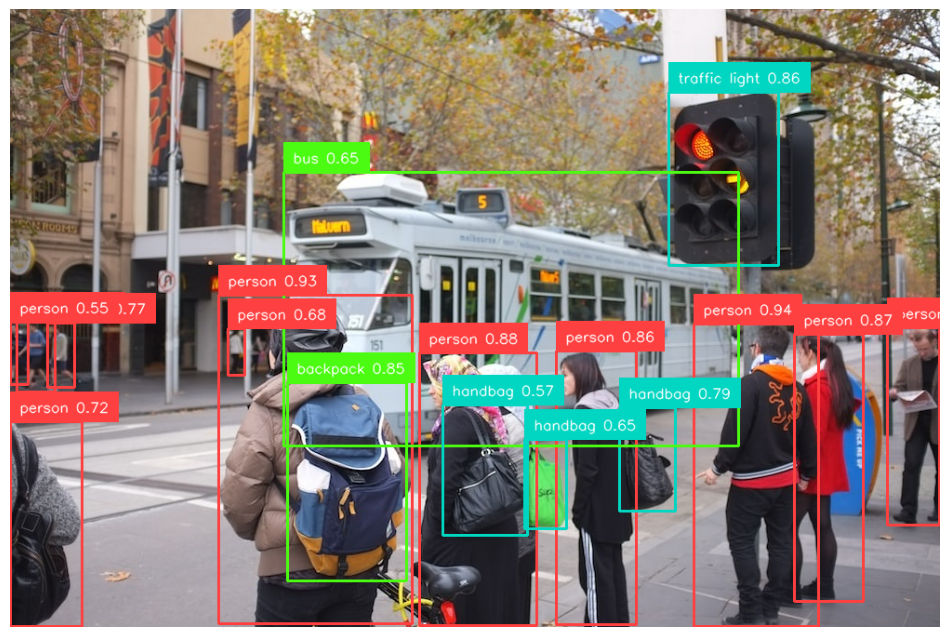

In [ ]:
model = RFDETRBase()

image = Image.open("/content/image.jpg")
detections = model.predict(image, threshold=0.35)

labels = [
    f"{COCO_CLASSES[class_id]} {confidence:.2f}"
    for class_id, confidence
    in zip(detections.class_id, detections.confidence)
]

annotated_image = image.copy()
annotated_image = sv.BoxAnnotator().annotate(annotated_image, detections)
annotated_image = sv.LabelAnnotator().annotate(annotated_image, detections, labels)

sv.plot_image(annotated_image)

**Videos**

In [20]:
import supervision as sv
from rfdetr import RFDETRBase
from tqdm import tqdm
from rfdetr.util.coco_classes import COCO_CLASSES

In [21]:
# Define input and output video paths
SOURCE_VIDEO_PATH = "/content/video.mp4"  # Change this to your input video path
TARGET_VIDEO_PATH = "/content/output_video.mp4"  # Change this to your desired output path

# Initialize the RFDETRBase model
model = RFDETRBase()

# Create a generator for video frames
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)

# Get video information (resolution, fps, etc.)
video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO_PATH)

# Process the video frame by frame
with sv.VideoSink(TARGET_VIDEO_PATH, video_info) as sink:
    for frame in tqdm(frame_generator, desc="Processing video"):
        # Get detections using RFDETRBase model
        detections = model.predict(frame, threshold=0.5, iou=0.1)

        # Map numeric class IDs to class names for labels
        labels = []
        for class_id in detections.class_id:
            # Get class name if exists in mapping
            class_name = COCO_CLASSES.get(class_id)
            #print("CLass Name", class_name)
            labels.append(class_name)

        # Create annotated frame
        annotated_frame = frame.copy()

        # Apply box annotations
        annotated_frame = sv.BoxAnnotator().annotate(scene=annotated_frame, detections=detections)

        # Apply label annotations with proper class names
        annotated_frame = sv.LabelAnnotator(text_thickness=2).annotate(
            scene=annotated_frame,
            detections=detections,
            labels=labels
        )

        # Write the annotated frame to output video
        sink.write_frame(annotated_frame)

print(f"Video processing complete. Output saved to {TARGET_VIDEO_PATH}")

Loading pretrain weights


Processing video: 458it [00:30, 15.20it/s]

Video processing complete. Output saved to /content/output_video.mp4


In [22]:
!rm '/content/result_compressed.mp4'

rm: cannot remove '/content/result_compressed.mp4': No such file or directory


In [23]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = f'/content/output_video.mp4'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)